In [1]:
import scanpy as sc
import os
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
sc.settings.verbosity=0 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.n_jobs=10
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
%matplotlib inline

In [2]:
from matplotlib import rcParams
sc.settings.figdir = "fig8"
sc.settings.set_figure_params(dpi_save=300, facecolor="white", frameon=False, figsize=(17,17))

rcParams["pdf.fonttype"] = 42
rcParams["ps.fonttype"] = 42

# fetal

In [3]:
PATH='/nfs/team298/ls34/fibroblast_atlas/fig1/adata_skin_gut_fetalonly.h5ad.integrated'
adata=sc.read_h5ad(PATH)
adata



AnnData object with n_obs × n_vars = 417398 × 31908
    obs: 'doublet_scores', 'predicted_doublets', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'DonorID', 'test12', 'Site_status', 'Site_status_binary', 'Mapping', 'lto'
    uns: 'Mapping_colors', 'log1p', 'lto_colors', 'neighbor_30', 'test12_colors', 'umap'
    obsm: 'X_scvi', 'X_umap'
    obsp: 'neighbor_30_connectivities', 'neighbor_30_distances'

In [4]:
adata.obs["lto"].value_counts()

lto
Other_skin         269661
Other intestine    147265
mLTo_intestine        363
LTo_skin              109
Name: count, dtype: int64

In [5]:
rename = {"LTo_skin": "CCL19+_skin",
         "Other intestine": "Other_intestine"}
adata.obs["lto"]=adata.obs["lto"].map(rename).fillna(adata.obs["lto"])
adata.obs["lto"].unique()


array(['Other_skin', 'CCL19+_skin', 'Other_intestine', 'mLTo_intestine'],
      dtype=object)

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


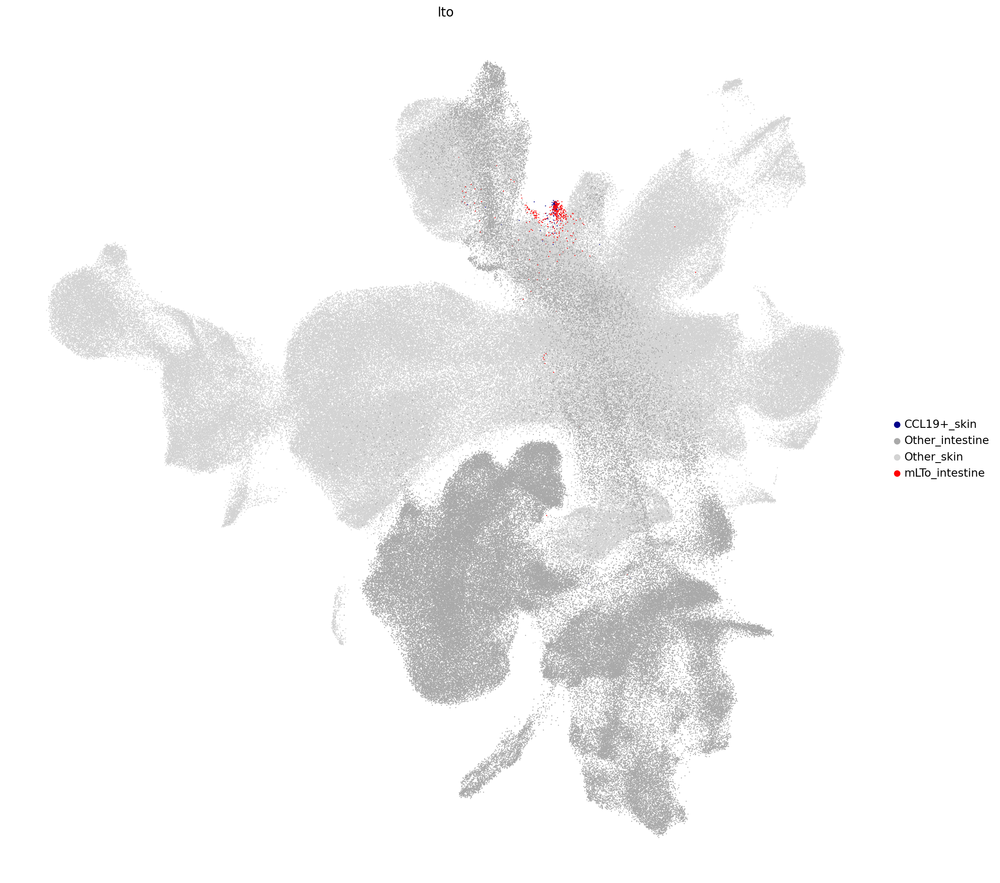

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


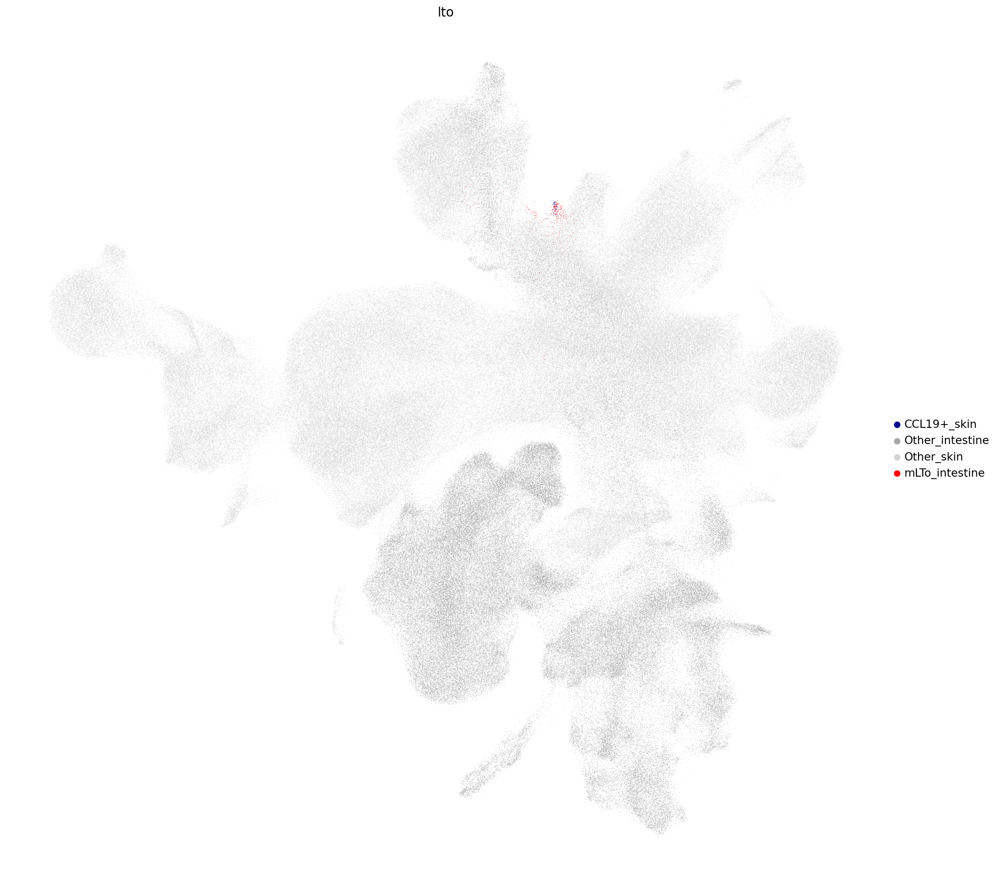

In [6]:
custom_colors = {
    "mLTo_intestine": '#ff0000',
    "CCL19+_skin": '#00008b',
    "Other_skin": "#d3d3d3",
    "Other_intestine": "#a9a9a9"
}

adata.obs['lto'] = adata.obs['lto'].astype('category')
adata.uns['lto_colors'] = [custom_colors[cat] for cat in adata.obs['lto'].cat.categories]
sc.pl.umap(
    adata,
    color="lto",
    vmax=0.8,
    s=5,
    legend_fontsize=12,
    save="lto_umap_size5.pdf"
)
sc.pl.umap(
    adata,
    color="lto",
    vmax=0.8,
    s=1,
    legend_fontsize=12,
    save="lto_umap_size1.pdf"
)

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

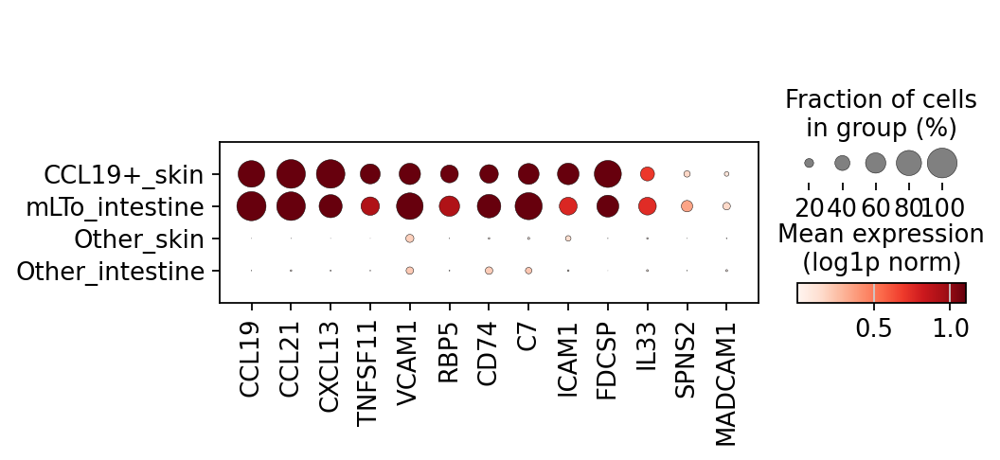

In [7]:
desired_order = ['CCL19+_skin', 'mLTo_intestine', 'Other_skin', 'Other_intestine']

adata.obs["lto"] = pd.Categorical(adata.obs["lto"], categories=desired_order, ordered=True)
lto_genes=['CCL19', 'CCL21', 'CXCL13',  'TNFSF11',  'VCAM1', 'RBP5', 'CD74',  
           'C7',
          'ICAM1',   
           'FDCSP', 'IL33', 'SPNS2', 'MADCAM1',
          ]



sc.pl.dotplot(
    adata,
    lto_genes,
    groupby="lto",
    vmax=1.1,
    colorbar_title='Mean expression\n(log1p norm)',
    dendrogram=False,
        save="fig8c_lto_dotplot_hoz_NEW.pdf"

)



In [8]:
adata = adata[~adata.obs["lto"].str.startswith("Other")]

In [9]:
adata_f3=sc.read_h5ad('/nfs/team298/ls34/disease_atlas/final_fb_adatas/adata_11_f3only.h5ad')
adata_f3.obs["lto"]=adata_f3.obs["test13"]
# base_dir = '/nfs/team298/ls34/new_disease_atlas/'
# #MODEL = #'model_scanvi5_FETALSKIN_4494'v1
# MODEL = "model_scanvi5_FETALSKIN_4099"
# PATH = base_dir + MODEL + '/'
# # PATH + 'adata_fetal_adult_f3only.h5ad'

In [10]:
adata_combined = ad.concat([adata,adata_f3])

In [11]:
import pickle

pickle_file_path = '/nfs/team298/ls34/fb_dict.pkl'

with open(pickle_file_path, 'rb') as file:
    reynolds_short_final = pickle.load(file)
reynolds_short_final["F3"]




['CCL19',
 'CD74',
 'CH25H',
 'TNFSF13B',
 'IL33',
 'IRF8',
 'IL15',
 'VCAM1',
 'HLA-DRA',
 'HLA-DRB1']

In [12]:
f3_markers = {"F3 markers (adult)": reynolds_short_final["F3"],
              "Additional LTo genes": [x for x in lto_genes if x not in reynolds_short_final["F3"]]}

In [13]:
# sc.settings.set_figure_params(dpi=300, dpi_save=300, facecolor="white", frameon=False, figsize=(17,17))
# sc.pl.dotplot(
#     adata_combined,
#     f3_markers,
#     groupby="lto",
#     vmax=1.1,
#     colorbar_title='Mean expression\n(log1p norm)',
#     dendrogram=False,
#         #save="fig8a_lto_dotplot_hoz_NEW.pdf"
#     categories_order=["F3: FRC-like",
#     "CCL19+_skin", "mLTo_intestine"],

# )



/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

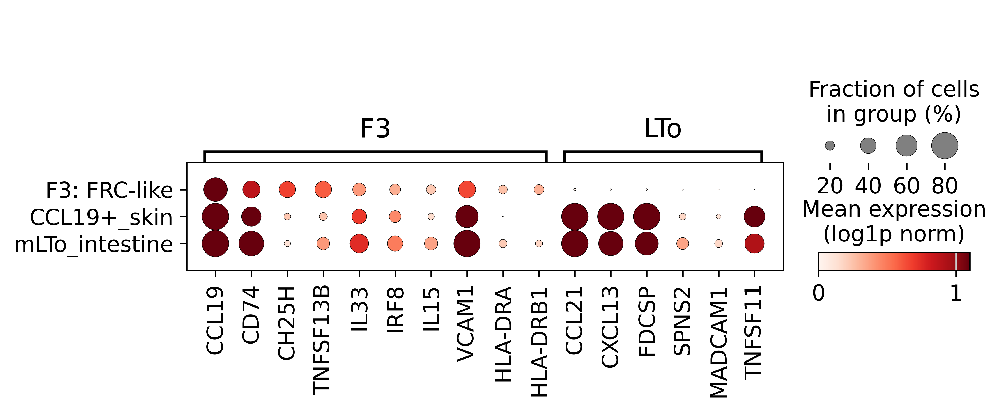

In [14]:
F3_GENES = {"F3":  ['CCL19',
 'CD74',
 'CH25H',
 'TNFSF13B',
 'IL33',
 'IRF8',
 'IL15',
 'VCAM1',
 'HLA-DRA',
 'HLA-DRB1'],            
           "LTo": [ 'CCL21',
 "CXCL13",'FDCSP', 'SPNS2', 'MADCAM1',
    'TNFSF11', #'RBP5',
                # 'C7', 'ICAM1', 
                  
              ]
  
           }
sc.settings.set_figure_params(dpi=300, dpi_save=300, facecolor="white", frameon=False, figsize=(17,17))
sc.pl.dotplot(
    adata_combined,
    F3_GENES,
    groupby="lto",
    vmax=1.1,
         dot_max=.8,
    colorbar_title='Mean expression\n(log1p norm)',
    dendrogram=False,
        #save="fig8a_lto_dotplot_hoz_NEW.pdf"
    categories_order=["F3: FRC-like",
    "CCL19+_skin", "mLTo_intestine"],
                save="fig8c2_lto_dotplot_hoz_NEW.pdf"


)



        

# for x in [ 'F3: FRC-like', ]:  
#     adata_i = adata_f3[adata_f3.obs["Patient_status2"]!="Nonlesional"]
#     print(adata_i.shape)
#     counts = pd.Series(adata_i.obs['Patient_status2']).value_counts()
#     filtered_counts = counts[counts > 100]
#     filtered_categories = filtered_counts.index.tolist()
#     xtick_order_filtered = [category for category in xtick_order_orig if category in filtered_categories]
#     xtick_order_with_counts = [
#         f"{category} (n={filtered_counts[category]})"
#         for category in xtick_order_filtered
#     ]
#     adata_i_filtered = adata_i[adata_i.obs['Patient_status2'].isin(filtered_categories)]
#     adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(
#         lambda x: f"{x} (n={filtered_counts[x]})"
#     )
#     sc.pl.dotplot(
#             adata_i_filtered,
#            F3_GENES,
#             groupby="Patient_status2_with_counts",
#             vmax=1.1,colorbar_title='Mean expression\n(log1p norm)', 
#             #standard_scale="var",
#             cmap="Reds",
       

#             categories_order=xtick_order_with_counts,
#             save="8g_diseasepolaridation_dotplot.pdf"
#         )
 

In [15]:
# stop

# Mouse figures

use fig8_mouse.ipynb


# disease poarisation

In [16]:
PATH='/nfs/team298/ls34/disease_atlas/final_fb_adatas/adata_all_6150_umap5.h5ad.paga2.annotated11'
adata_f3=sc.read_h5ad(PATH)

In [17]:
adata_f3=adata_f3[adata_f3.obs["test13"].str.startswith("F3")]

In [18]:
f3_genes = { 'F3': ['CCL19',"CD74" ,  'CH25H',  "TNFSF13B",  'IL33', "IRF8" , 
        "IL15",
        "VCAM1", "HLA-DRA", "HLA-DRB1",
                            
 
           ], "Activated": ["ADAMDEC1", "CXCL9", 
                            
                           ],
           "Additional LTo": [  "CXCL13",  "CTSH", "PTGDS", "TNFSF11"]
           }
        


In [19]:
# xtick_order_orig=["Dupuytren contracture",
#  'Keloid scar',
#  'Morphoea (pansclerotic)',
#  'Systemic sclerosis',
#  'Non-keloid scar',
#  'Basal cell carcinoma',
#  'Squamous cell carcinoma',
#  'Acral melanoma',
#  'Cutaneous melanoma',
#  'Sarcoidosis',
#  'Granuloma annulare',
#  'Hidradenitis suppurativa',
#  'Lupus (DLE)',
#  'Acne',
#  'Psoriasis',
#  'Eczema',
#  'Prurigo nodularis',
#  'Drug reaction: lichenoid',
#  'Drug reaction: DRESS',
#  'Lupus (SCLE)',
#  'Alopecia areata',
#   'Erythema migrans',
#  'Neurofibroma']
xtick_order_orig= ['Prurigo nodularis',
       'Eczema', 'Alopecia areata', 'Drug reaction: lichenoid',
       'Psoriasis', 'Lupus (SCLE)', 'Erythema migrans', 'Drug reaction: DRESS',
        'Hidradenitis suppurativa',
       'Sarcoidosis', 'Granuloma annulare', 'Acne', 'Lupus (DLE)',
       'Acral melanoma',
       'Cutaneous melanoma', 'Basal cell carcinoma', 'Squamous cell carcinoma',
       'Cancer_spacer', 'Keloid scar', 'Non-keloid scar', 'Systemic sclerosis',
       'Morphoea (pansclerotic)', 'Dupuytren contracture',
       'Neurofibroma', ]

(23147, 36601)


/tmp/ipykernel_10711/2573718386.py:34: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs

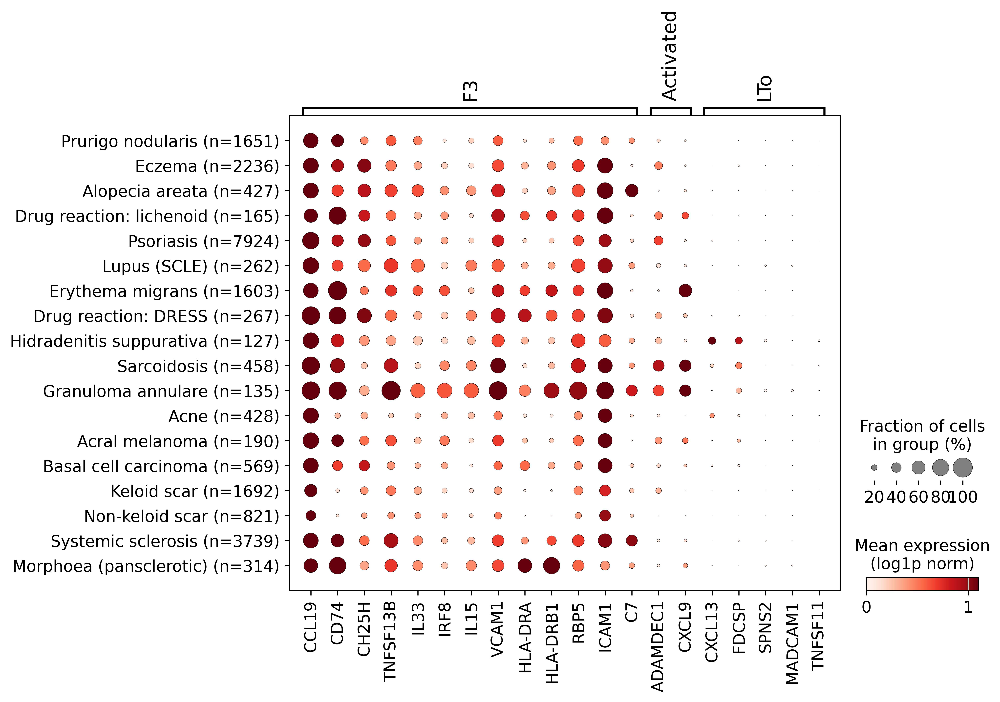

In [20]:
F3_GENES = {"F3":  ['CCL19',
 'CD74',
 'CH25H',
 'TNFSF13B',
 'IL33',
 'IRF8',
 'IL15',
 'VCAM1',
 'HLA-DRA',
 'HLA-DRB1', "RBP5", "ICAM1",  'C7'], 
            "Activated": ["ADAMDEC1", "CXCL9"],
                                                    
          "LTo": [  "CXCL13",
                  
                  
           'FDCSP', 'SPNS2', 'MADCAM1',   "TNFSF11",]
  
           }
        


for x in [ 'F3: FRC-like', ]:  
    adata_i = adata_f3[adata_f3.obs["Patient_status2"]!="Nonlesional"]
    print(adata_i.shape)
    counts = pd.Series(adata_i.obs['Patient_status2']).value_counts()
    filtered_counts = counts[counts > 100]
    filtered_categories = filtered_counts.index.tolist()
    xtick_order_filtered = [category for category in xtick_order_orig if category in filtered_categories]
    xtick_order_with_counts = [
        f"{category} (n={filtered_counts[category]})"
        for category in xtick_order_filtered
    ]
    adata_i_filtered = adata_i[adata_i.obs['Patient_status2'].isin(filtered_categories)]
    adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(
        lambda x: f"{x} (n={filtered_counts[x]})"
    )
    sc.pl.dotplot(
            adata_i_filtered,
           F3_GENES,
            groupby="Patient_status2_with_counts",
            vmax=1.1,colorbar_title='Mean expression\n(log1p norm)', 
            #standard_scale="var",
            cmap="Reds",
            dot_max=1,

            categories_order=xtick_order_with_counts,
            save="8e_diseasepolaridation_dotplot.pdf"
        )
 

/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(

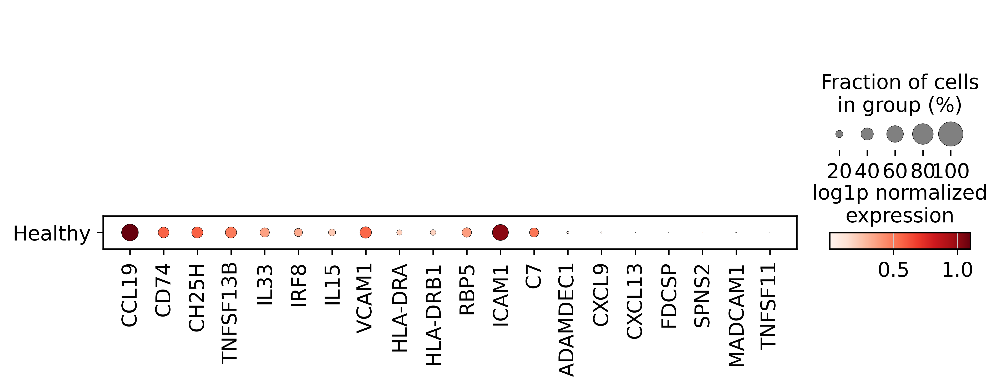

In [21]:
adata_i = adata_f3[adata_f3.obs["Patient_status2"]=="Nonlesional"]
adata_i = adata_f3[adata_f3.obs["Patient_status"]=="Healthy"]
F3_GENES = [gene for sublist in F3_GENES.values() for gene in sublist]

sc.pl.dotplot(
            adata_i,
           F3_GENES,
            groupby="Patient_status",
            vmax=1.1,colorbar_title='log1p normalized\nexpression', 
    dot_max=1,
            #standard_scale="var",
            cmap="Reds",
            save="8e_diseasepolaridation_dotplot1.pdf"


    
        )

(23147, 36601)


/tmp/ipykernel_10711/3933587852.py:35: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs

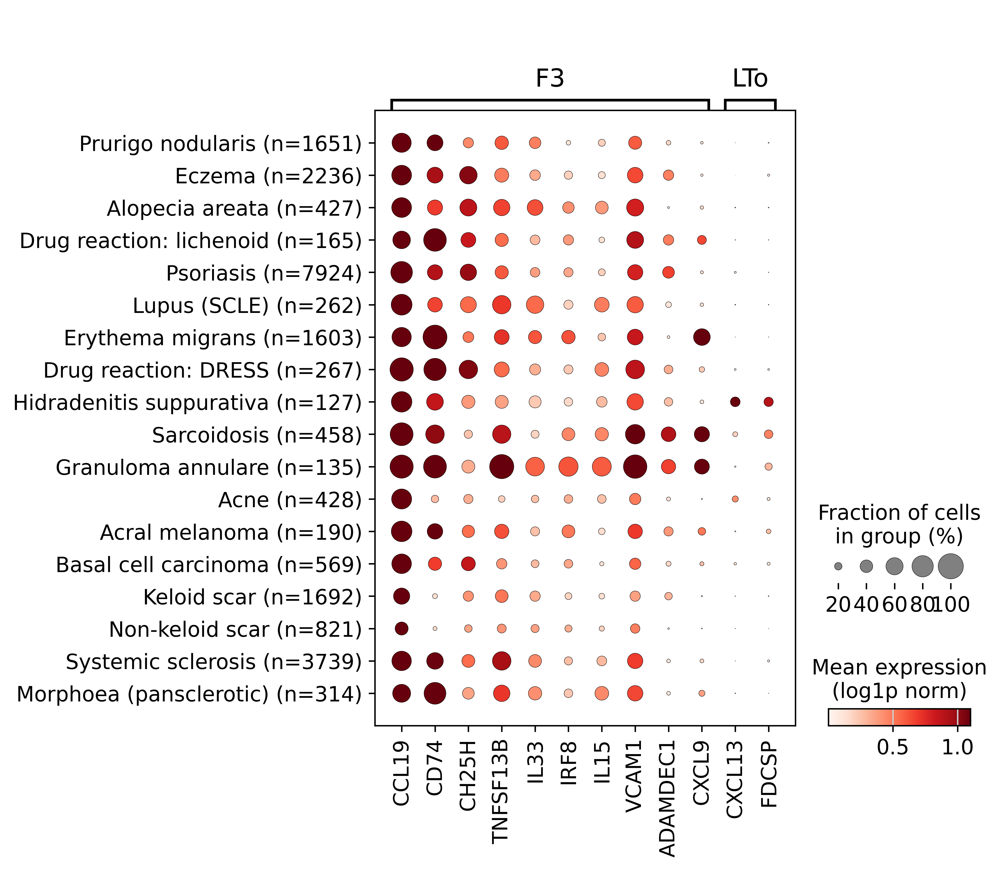

In [22]:
F3_GENES = {"F3":  ['CCL19',
 'CD74',
 'CH25H',
 'TNFSF13B',
 'IL33',
 'IRF8',
 'IL15',
 'VCAM1',
 #'HLA-DRA',
 #'HLA-DRB1', "RBP5", "ICAM1",  'C7'
               "ADAMDEC1", "CXCL9"],
                                                    
          "LTo": [  "CXCL13",
                  
                  
           'FDCSP', #'SPNS2', #'MADCAM1',   "TNFSF11",
                 ]
  
           }
        


for x in [ 'F3: FRC-like', ]:  
    adata_i = adata_f3[adata_f3.obs["Patient_status2"]!="Nonlesional"]
    print(adata_i.shape)
    counts = pd.Series(adata_i.obs['Patient_status2']).value_counts()
    filtered_counts = counts[counts > 100]
    filtered_categories = filtered_counts.index.tolist()
    xtick_order_filtered = [category for category in xtick_order_orig if category in filtered_categories]
    xtick_order_with_counts = [
        f"{category} (n={filtered_counts[category]})"
        for category in xtick_order_filtered
    ]
    adata_i_filtered = adata_i[adata_i.obs['Patient_status2'].isin(filtered_categories)]
    adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(
        lambda x: f"{x} (n={filtered_counts[x]})"
    )
    sc.pl.dotplot(
            adata_i_filtered,
           F3_GENES,
            groupby="Patient_status2_with_counts",
            vmax=1.1,colorbar_title='Mean expression\n(log1p norm)', 
            #standard_scale="var",
            cmap="Reds",
            dot_max=1,

            categories_order=xtick_order_with_counts,
            save="8e_diseasepolaridation_dotplot2.pdf"
        )
 

(23147, 36601)


/tmp/ipykernel_10711/3582579979.py:34: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs

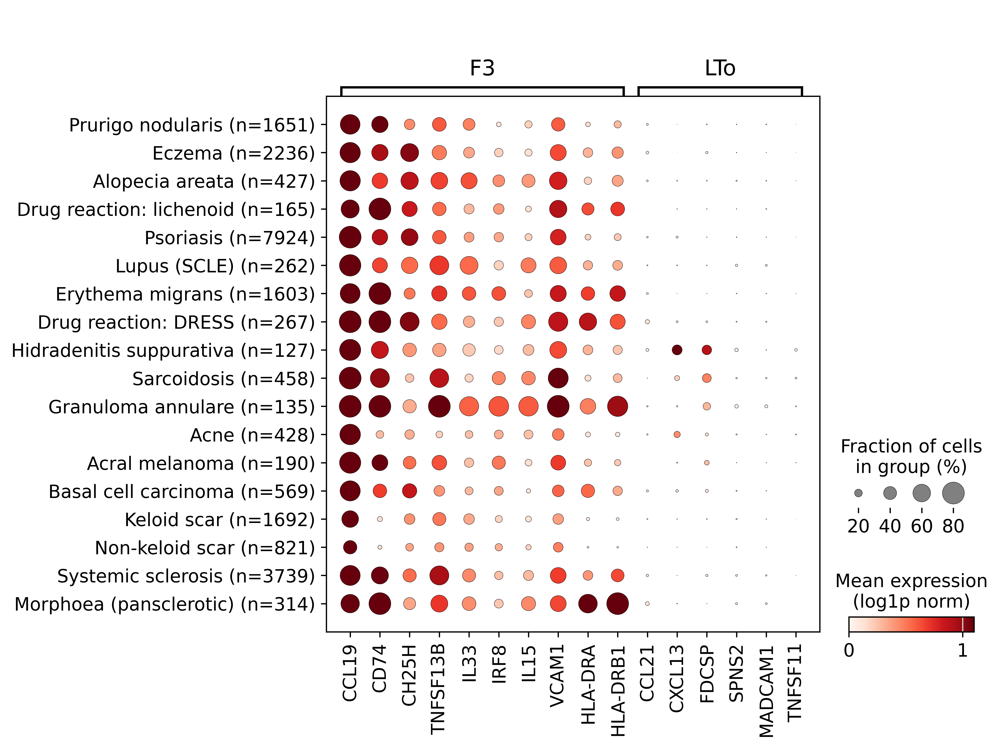

In [23]:
F3_GENES = {"F3":  ['CCL19',
 'CD74',
 'CH25H',
 'TNFSF13B',
 'IL33',
 'IRF8',
 'IL15',
 'VCAM1',
 'HLA-DRA',
 'HLA-DRB1'],            
           "LTo": [ 'CCL21',
 "CXCL13",'FDCSP', 'SPNS2', 'MADCAM1',
    'TNFSF11', #'RBP5',
                # 'C7', 'ICAM1', 
                  
              ]
  
           }

        

for x in [ 'F3: FRC-like', ]:  
    adata_i = adata_f3[adata_f3.obs["Patient_status2"]!="Nonlesional"]
    print(adata_i.shape)
    counts = pd.Series(adata_i.obs['Patient_status2']).value_counts()
    filtered_counts = counts[counts > 100]
    filtered_categories = filtered_counts.index.tolist()
    xtick_order_filtered = [category for category in xtick_order_orig if category in filtered_categories]
    xtick_order_with_counts = [
        f"{category} (n={filtered_counts[category]})"
        for category in xtick_order_filtered
    ]
    adata_i_filtered = adata_i[adata_i.obs['Patient_status2'].isin(filtered_categories)]
    adata_i_filtered.obs['Patient_status2_with_counts'] = adata_i_filtered.obs['Patient_status2'].map(
        lambda x: f"{x} (n={filtered_counts[x]})"
    )
    sc.pl.dotplot(
            adata_i_filtered,
           F3_GENES,
            groupby="Patient_status2_with_counts",
            vmax=1.1,colorbar_title='Mean expression\n(log1p norm)', 
            #standard_scale="var",
            cmap="Reds",
            dot_max=.8,

            categories_order=xtick_order_with_counts,
            save="8e_diseasepolaridation_dotplot.pdf"
        )
 

In [24]:

# adata_i = adata_f3[adata_f3.obs["Patient_status2"]=="Nonlesional"]
# adata_i = adata_f3[adata_f3.obs["Patient_status"]=="Healthy"]
# F3_GENES = [gene for sublist in F3_GENES.values() for gene in sublist]

# sc.pl.dotplot(
#             adata_i,
#            F3_GENES,
#             groupby="Patient_status",
#             vmax=1.1,colorbar_title='log1p normalized\nexpression', 
#     dot_max=1,
#             #standard_scale="var",
#             cmap="Reds",
#                 save="8e_diseasepolaridation_dotplot_healthy.pdf"


    
#         )

# prenatal

In [1]:
import scanpy as sc
import os
base_dir = '/nfs/team298/ls34/new_disease_atlas/'
#MODEL = #'model_scanvi5_FETALSKIN_4494'v1
MODEL = "model_scanvi5_FETALSKIN_4099"
PATH = base_dir + MODEL + '/'

os.listdir(PATH)
 
adata=sc.read_h5ad(PATH + 'adata_all_scvi5.h5ad.countsonly')
adata.X[:5,:5].A

array([[0.        , 0.        , 0.51248444, 0.51248444, 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.91178454, 0.        , 0.        ],
       [0.58537907, 0.        , 0.        , 0.        , 0.        ],
       [0.39431788, 0.        , 0.39431788, 0.        , 0.        ]])

In [2]:
from matplotlib import rcParams
sc.settings.figdir = "fig8"
sc.settings.set_figure_params(dpi_save=300, facecolor="white", frameon=False, figsize=(17,17))

rcParams["pdf.fonttype"] = 42
rcParams["ps.fonttype"] = 42

In [3]:
adata=adata[adata.obs["test13"]!="ePericytes"]
adata=adata[adata.obs["test13"]!="Adipocytes"]


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


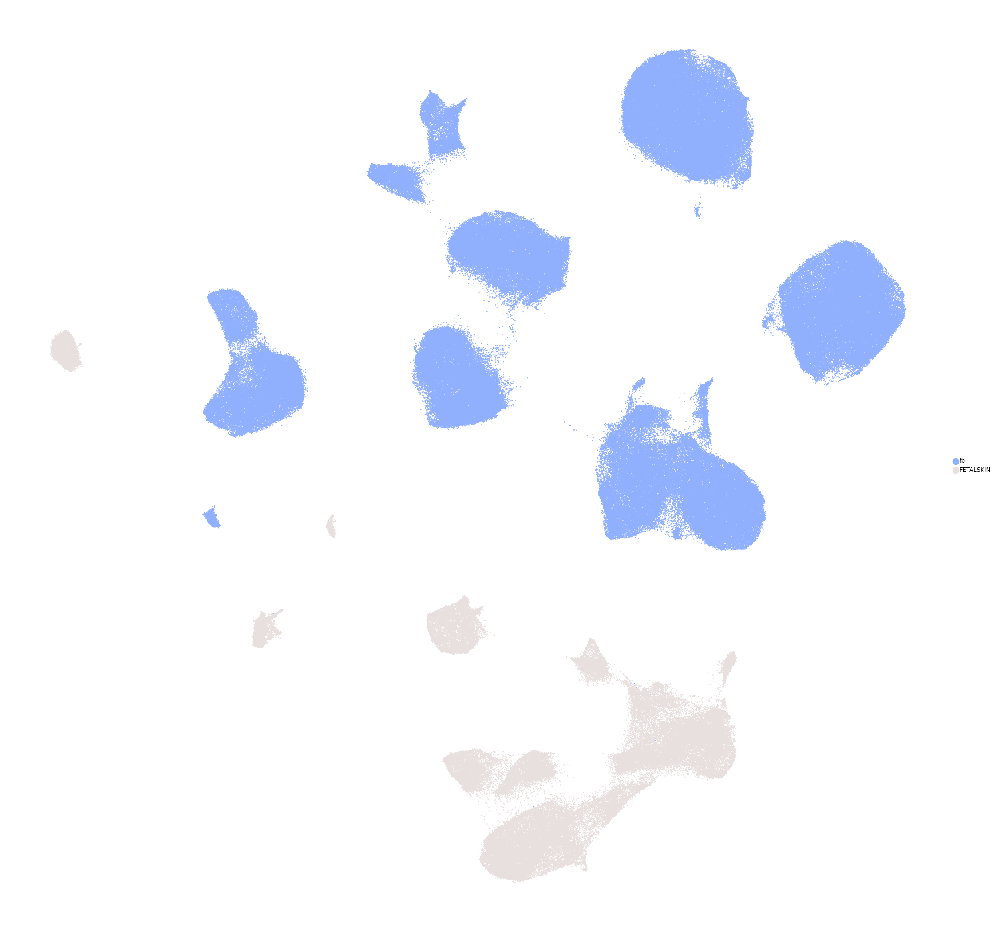

In [4]:
#sc.tl.umap(adata,min_dist=0.3,neighbors_key="neighbor_20")

sc.pl.umap(adata, 
           color = ["Mapping_status2"],
          #legend_loc="on data",
          legend_fontsize=6,vmax=10,title='',
          s=5,
           palette = [  "#90B0FE",
        
          "#E8E0DF",],
           save="8a_umap_fetal_vs_adult.pdf"
          )
           


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jovyan/my-conda-envs/sko_ls/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1107: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], c=palette[label], label=label)


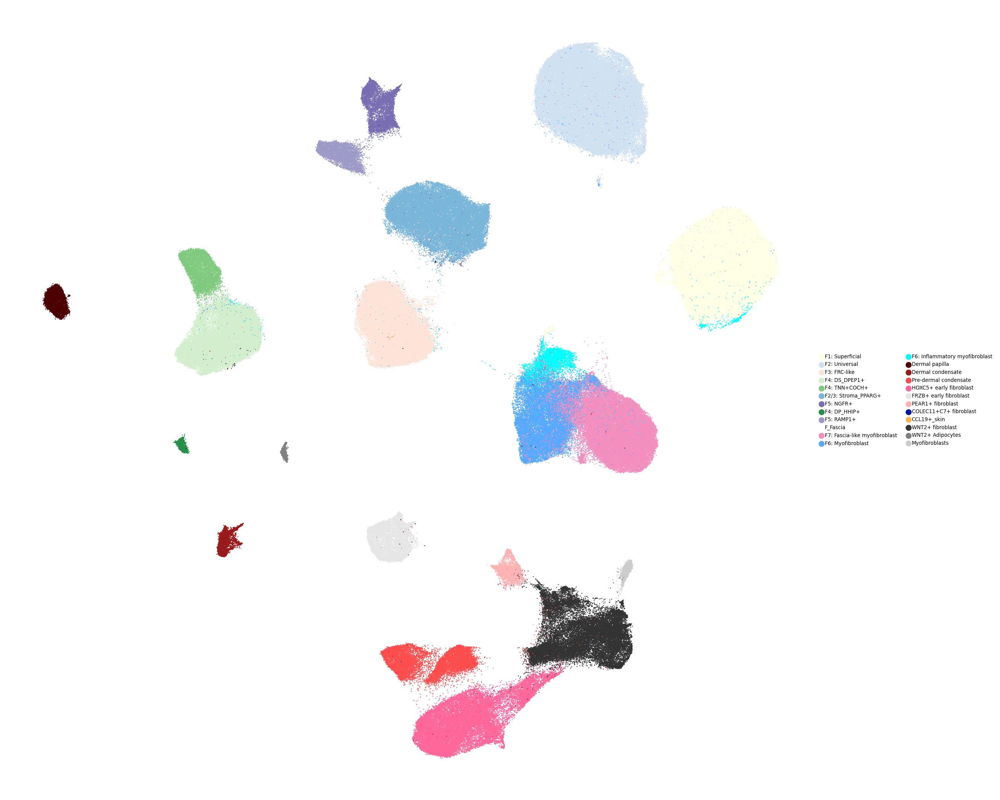

In [5]:
import numpy as np
import pandas as pd
COLORS = {
    'F1: Superficial': np.array([1.0, 1.0, 0.898, 1.0]),
    'F2: Universal': np.array([0.814, 0.884, 0.950, 1.0]),
    'F3: FRC-like': np.array([0.997, 0.896, 0.849, 1.0]),
    'F4: DS_DPEP1+': np.array([0.827, 0.933, 0.803, 1.0]),
    'F4: TNN+COCH+': np.array([0.502, 0.791, 0.501, 1.0]),
    'F2/3: Stroma_PPARG+': np.array([0.473, 0.712, 0.851, 1.0]),
    'F5: NGFR+': np.array([0.473, 0.433, 0.699, 1.0]),
    'F4: DP_HHIP+': np.array([0.153, 0.562, 0.283, 1.0]),
    'F5: RAMP1+': np.array([0.618, 0.602, 0.783, 1.0]),
    'F_Fascia': np.array([0.0, 0.0, 0.0, 0.0]),
    'F7: Fascia-like myofibroblast': np.array([0.957, 0.557, 0.745, 1.0]),
    'F6: Myofibroblast': np.array([0.333, 0.667, 1.0, 1.0]),
    'F6: Inflammatory myofibroblast': np.array([0.0, 1.0, 1.0, 1.0]),

    # More distinct shades of Red
'Dermal papilla': np.array([0.3, 0.0, 0.0, 1.0]),  # Darkest Red  
'Dermal condensate': np.array([0.6, 0.1, 0.1, 1.0]),  # Darker Crimson
    'Pre-dermal condensate': np.array([1.0, 0.3, 0.3, 1.0]),  # Bright Red

    # More distinct shades of Pink
    'HOXC5+ early fibroblast': np.array([1.0, 0.4, 0.6, 1.0]),  # Hot Pink
'FRZB+ early fibroblast': np.array([0.9, 0.9, 0.9, 1.0]),  # Very Light Grey
    # More distinct shades of Orange
'PEAR1+ fibroblast': np.array([1.0, 0.7, 0.7, 1.0]),  # Very Light Red
'COLEC11+C7+ fibroblast': np.array([0.0, 0.1, 0.6, 1.0]),  # Dark Electric Blue
    'CCL19+_skin': np.array([1.0, 0.7, 0.3, 1.0]),  # Pale Orange

    # More distinct shades of Grey
    'WNT2+ fibroblast': np.array([0.2, 0.2, 0.2, 1.0]),  # Almost Black
    'WNT2+ Adipocytes': np.array([0.5, 0.5, 0.5, 1.0]),  # Medium Grey
    'Myofibroblasts': np.array([0.8, 0.8, 0.8, 1.0]),  # Light Grey
}

# Ensure the test13 column is categorical and order it according to COLORS dict
adata.obs["test13"] = pd.Categorical(adata.obs["test13"], categories=COLORS.keys(), ordered=True)

# Assign colors to adata.uns based on the reordered categories
adata.uns["test13_colors"] = [COLORS[cat] for cat in adata.obs["test13"].cat.categories]

# Plot UMAP with the custom colors and legend order
# sc.pl.umap(
#     adata, 
#     color=["test13"], 
#     legend_loc="on data",
#     legend_fontsize=6,
#     legend_fontoutline=2,
#     s=5,
#     title=''
# )

sc.pl.umap(
    adata, 
    color=["test13"], 
    legend_fontsize=6,
    legend_fontoutline=2,
    s=5,
    title='',
    save="8a_prenatal_umap_celltypes2c.pdf"
)
# sc.pl.umap(
#     adata, 
#     color=["test13"], 
#     legend_fontsize=6,
#     legend_fontoutline=2,
#     s=1,
#     title='',
#     legend_loc=None
# )